In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
import tensorflow.compat.v1 as tf
import math
import numpy as np
import itertools

tf.enable_eager_execution()
np.set_printoptions(precision=4, suppress=True)
from waymo_open_dataset.utils import range_image_utils
from waymo_open_dataset.utils import transform_utils
from waymo_open_dataset.utils import  frame_utils
from waymo_open_dataset import dataset_pb2 as open_dataset

2023-02-07 10:31:03.074346: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-07 10:31:04.251859: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/lib/
2023-02-07 10:31:04.251927: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/lib/
2023-02-07 10:31:04.251933: W tensorflow/compiler/tf2tensorrt/utils/py_uti

In [5]:
# FILENAME = 'tutorial/frames'
FILENAME = 'waymo/waymo_format/validation/segment-260994483494315994_2797_545_2817_545_with_camera_labels.tfrecord'
! ls -h $FILENAME
dataset = tf.data.TFRecordDataset(FILENAME, compression_type='')
# print(f'There are {len(list(dataset))} frames in the dataset')
for data in dataset:
    frame = open_dataset.Frame()
    frame.ParseFromString(bytearray(data.numpy()))
    break


waymo/waymo_format/validation/segment-260994483494315994_2797_545_2817_545_with_camera_labels.tfrecord


In [6]:
(range_images, camera_projections, _, range_image_top_pose) = frame_utils.parse_range_image_and_camera_projection(frame)

In [7]:
points, cp_points = frame_utils.convert_range_image_to_point_cloud(
    frame,
    range_images,
    camera_projections,
    range_image_top_pose)
points_ri2, cp_points_ri2 = frame_utils.convert_range_image_to_point_cloud(
    frame,
    range_images,
    camera_projections,
    range_image_top_pose,
    ri_index=1)

# 3d points in vehicle frame.
points_all_ri1 = np.concatenate(points, axis=0)
points_all_ri2 = np.concatenate(points_ri2, axis=0)
points_all = np.concatenate([points_all_ri1, points_all_ri2], axis=0)
# camera projection corresponding to each point.
cp_points_all_ri1 = np.concatenate(cp_points, axis=0)
cp_points_all_ri2 = np.concatenate(cp_points_ri2, axis=0)
cp_points_all = np.concatenate([cp_points_all_ri1, cp_points_all_ri2], axis=0)


In [8]:
cp_points_all[cp_points_all[:,0]==1]

array([[   1,  469,  580,    0,    0,    0],
       [   1, 1560,  586,    0,    0,    0],
       [   1, 1585,  586,    0,    0,    0],
       ...,
       [   1, 1728,  876,    3,   36,  851],
       [   1, 1733,  876,    3,   41,  851],
       [   1, 1829,  594,    3,  147,  557]], dtype=int32)

In [18]:
images = sorted(frame.images, key=lambda i: i.name)
cp_points_all_concat = np.concatenate([cp_points_all, points_all], axis=-1)
cp_points_all_concat_tensor = tf.constant(cp_points_all_concat)
# The distance between lidar points and vehicle frame origin.
distance_all_tensor = tf.norm(points_all, axis=-1, keepdims=True)
cp_points_all_tensor = tf.constant(cp_points_all, dtype=tf.int32)
# image 0's mask
img_idx = np.random.choice(len(images))
mask = tf.equal(cp_points_all_tensor[..., 0], images[img_idx].name)

cp_points_all_tensor = tf.cast(tf.gather_nd(
    cp_points_all_tensor, tf.where(mask)), dtype=tf.float32)
distance_all_tensor = tf.gather_nd(distance_all_tensor, tf.where(mask))

projected_points_all_from_raw_data = tf.concat(
    [cp_points_all_tensor[..., 1:3], distance_all_tensor], axis=-1).numpy()


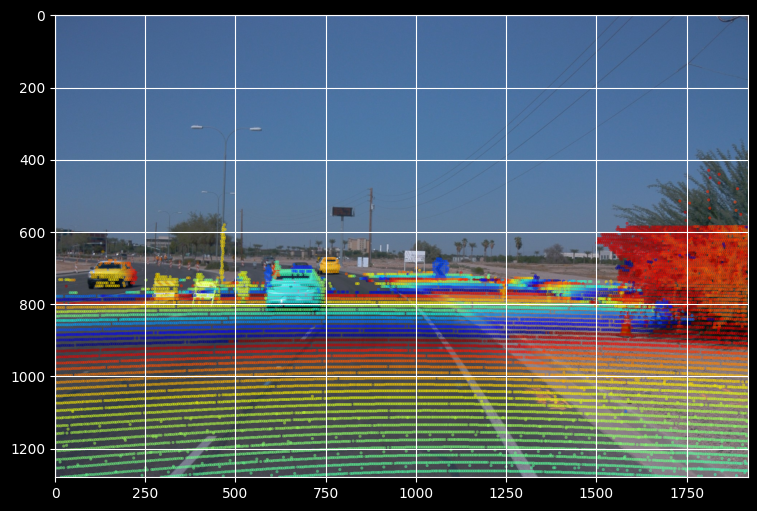

In [19]:

import matplotlib.pyplot as plt
def rgba(r):
  """Generates a color based on range.

  Args:
    r: the range value of a given point.
  Returns:
    The color for a given range
  """
  c = plt.get_cmap('jet')((r % 20.0) / 20.0)
  c = list(c)
  c[-1] = 0.5  # alpha
  return c


def plot_image(camera_image):
  """Plot a cmaera image."""
  plt.figure(figsize=(10, 6))
  plt.imshow(tf.image.decode_jpeg(camera_image.image))
  plt.grid("off")


def plot_points_on_image(projected_points, camera_image, rgba_func,
                         point_size=5.0):
  """Plots points on a camera image.

  Args:
    projected_points: [N, 3] numpy array. The inner dims are
      [camera_x, camera_y, range].
    camera_image: jpeg encoded camera image.
    rgba_func: a function that generates a color from a range value.
    point_size: the point size.

  """
  plot_image(camera_image)

  xs = []
  ys = []
  colors = []

  for point in projected_points:
    xs.append(point[0])  # width, col
    ys.append(point[1])  # height, row
    colors.append(rgba_func(point[2]))

  plt.scatter(xs, ys, c=colors, s=point_size, edgecolors="none")
  
plot_points_on_image(projected_points_all_from_raw_data,
                     images[img_idx], rgba, point_size=5.0)


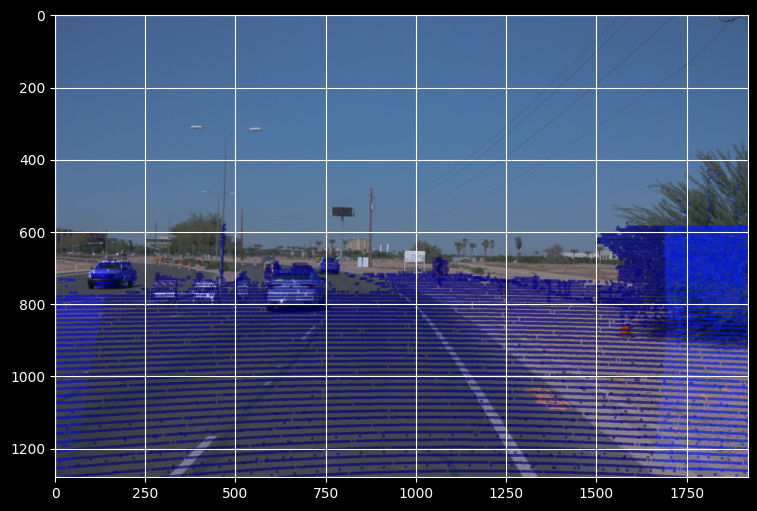

In [20]:
def plot_points_on_images(cp_points, images):
    # img_idx = np.random.choice(len(images))
    camera_image = images[img_idx]
    plot_image(camera_image)

    xs = []
    ys = []
    colors = []
    projected_points = cp_points[cp_points[:,0]==camera_image.name]
    for point in projected_points:
        xs.append(point[1])  # width, col
        ys.append(point[2])  # height, row
        colors.append(rgba(point[3]))

    plt.scatter(xs, ys, c=colors, s=5, edgecolors="none")
    
plot_points_on_images(cp_points_all, images)

# use projection matrix

In [51]:
import cv2
calibrations = sorted(frame.context.camera_calibrations, key=lambda c: c.name)
# img_idx = np.random.choice(len(images))
c = calibrations[img_idx] 
h, w = c.height, c.width
print(c.name, h, w)
extrinsic = np.array(c.extrinsic.transform).reshape([4, 4])
extrinsic = np.linalg.inv(extrinsic)
rmat = extrinsic[0:3,0:3]
rvec, jacobian = cv2.Rodrigues(rmat)
tvec = extrinsic[0:3,3]
f_u, f_v, c_u, c_v, k_1, k_2, p_1, p_2, k_3 = c.intrinsic
cameraMatrix = np.array([
    [f_u, 0,   c_u],
    [0,   f_v, c_v],
    [0,   0,     1]])
distCoeffs = np.array([k_1, k_2, p_1, p_2, k_3])

distance = np.linalg.norm(points_all, axis=-1, keepdims=True)
# option1: use cv projection, not working...
# imagePoints, jacobian = cv2.projectPoints(points_all, rvec, tvec, cameraMatrix, distCoeffs) 
# imagePoints = imagePoints.squeeze()
# print(imagePoints.shape)

# option2: manual projection
xyz = (rmat @ points_all.T).T + tvec
xy = -xyz[:,1:3]/ xyz[:,[0]]
filterBySize = lambda xy, w, h: (xy[:,0] > 0) & (xy[:,0] < w) & (xy[:,1] > 0) & (xy[:,1] < h)
mask1 = filterBySize(xy, w, h)
mask2 = xyz[:, 0] > 0
mask = mask1 & mask2
xy = xy[mask]
distance = distance[mask]
# distortion
r2 = np.sum(xy**2, axis=-1)
r_d = 1.0 + k_1 * r2 + k_2 * r2**2 + k_3 * r2**3
x_ = xy[:,0] * r_d + 2.0 * p_1 * xy[:,0] * xy[:,1] + p_2 * (r2 + 2.0 * xy[:,0]**2)
y_ = xy[:,1] * r_d + p_1 * (r2 + 2.0 * xy[:,1]**2) + 2.0 * p_2 * xy[:,0] * xy[:,1]
xy = np.concatenate([x_[...,np.newaxis], y_[...,np.newaxis]], axis=-1)
imagePoints = xy * np.array([f_u, f_v]) + np.array([c_u, c_v])

# filter
imagePoints = np.concatenate([imagePoints, distance], axis=-1)
# mask = (imagePoints[:,0] > 0) & (imagePoints[:,0] < w) & (imagePoints[:,1] > 0) & (imagePoints[:,1] < h)
# imagePoints = imagePoints[mask]
print(imagePoints.shape)

1 1280 1920
(36308, 3)


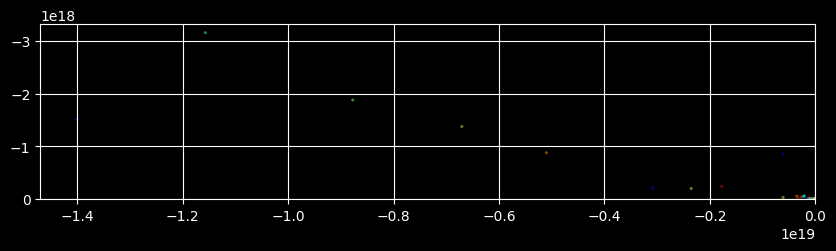

In [53]:
camera_image = images[img_idx]

xs = []
ys = []
colors = []
for point in imagePoints:
    xs.append(point[0])  # width, col
    ys.append(point[1])  # height, row
    colors.append(rgba(point[2]))

plot_image(camera_image)
plt.scatter(xs, ys, c=colors, s=5, edgecolors="none")